In [ ]:
!pip install ydata_profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 73.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=c12bd18ec6eddfabcf3fd9b0b20dd1e856bb9fde70cbc514064aba2acf326657
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


##Module 2: Regression

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import ydata_profiling

In [ ]:
def plot_correlation_heatmap(corr_matrix, title):
    plt.figure(figsize=(15, 10))
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
    plt.title(title, fontsize=16)
    plt.show()

In [ ]:
data = pd.read_csv("/content/AirQualityUCI.csv", sep=';')
data = data.dropna(axis=1, how='all')
data.head(10)

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,"2,6",1360.0,150.0,"11,9",1046.0,166.0,1056.0,113.0,1692.0,1268.0,"13,6","48,9","0,7578"
1,10/03/2004,19.00.00,2,1292.0,112.0,"9,4",955.0,103.0,1174.0,92.0,1559.0,972.0,"13,3","47,7","0,7255"
2,10/03/2004,20.00.00,"2,2",1402.0,88.0,"9,0",939.0,131.0,1140.0,114.0,1555.0,1074.0,"11,9","54,0","0,7502"
3,10/03/2004,21.00.00,"2,2",1376.0,80.0,"9,2",948.0,172.0,1092.0,122.0,1584.0,1203.0,"11,0","60,0","0,7867"
4,10/03/2004,22.00.00,"1,6",1272.0,51.0,"6,5",836.0,131.0,1205.0,116.0,1490.0,1110.0,"11,2","59,6","0,7888"
5,10/03/2004,23.00.00,"1,2",1197.0,38.0,"4,7",750.0,89.0,1337.0,96.0,1393.0,949.0,"11,2","59,2","0,7848"
6,11/03/2004,00.00.00,"1,2",1185.0,31.0,"3,6",690.0,62.0,1462.0,77.0,1333.0,733.0,"11,3","56,8","0,7603"
7,11/03/2004,01.00.00,1,1136.0,31.0,"3,3",672.0,62.0,1453.0,76.0,1333.0,730.0,"10,7","60,0","0,7702"
8,11/03/2004,02.00.00,"0,9",1094.0,24.0,"2,3",609.0,45.0,1579.0,60.0,1276.0,620.0,"10,7","59,7","0,7648"
9,11/03/2004,03.00.00,"0,6",1010.0,19.0,"1,7",561.0,-200.0,1705.0,-200.0,1235.0,501.0,"10,3","60,2","0,7517"


In [ ]:
for col in data.columns:
    if data[col].dtype == 'object':
        if data[col].str.contains(',', na=False).any():
            data[col] = data[col].str.replace(',', '.')
            data[col] = pd.to_numeric(data[col], errors='coerce')


In [ ]:
data.shape

(9471, 15)

In [ ]:
data.head(10)

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18.00.00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19.00.00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20.00.00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21.00.00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22.00.00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888
5,10/03/2004,23.00.00,1.2,1197.0,38.0,4.7,750.0,89.0,1337.0,96.0,1393.0,949.0,11.2,59.2,0.7848
6,11/03/2004,00.00.00,1.2,1185.0,31.0,3.6,690.0,62.0,1462.0,77.0,1333.0,733.0,11.3,56.8,0.7603
7,11/03/2004,01.00.00,1.0,1136.0,31.0,3.3,672.0,62.0,1453.0,76.0,1333.0,730.0,10.7,60.0,0.7702
8,11/03/2004,02.00.00,0.9,1094.0,24.0,2.3,609.0,45.0,1579.0,60.0,1276.0,620.0,10.7,59.7,0.7648
9,11/03/2004,03.00.00,0.6,1010.0,19.0,1.7,561.0,-200.0,1705.0,-200.0,1235.0,501.0,10.3,60.2,0.7517


In [ ]:
data.describe()

,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000,9357.000000
mean,-34.207524,1048.990061,-159.090093,1.865683,894.595276,168.616971,794.990168,58.148873,1391.479641,975.072032,9.778305,39.485380,-6.837604
std,77.657170,329.832710,139.789093,41.380206,342.333252,257.433866,321.993552,126.940455,467.210125,456.938184,43.203623,51.216145,38.976670
min,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000,-200.000000
25%,0.600000,921.000000,-200.000000,4.000000,711.000000,50.000000,637.000000,53.000000,1185.000000,700.000000,10.900000,34.100000,0.692300
50%,1.500000,1053.000000,-200.000000,7.900000,895.000000,141.000000,794.000000,96.000000,1446.000000,942.000000,17.200000,48.600000,0.976800
75%,2.600000,1221.000000,-200.000000,13.600000,1105.000000,284.000000,960.000000,133.000000,1662.000000,1255.000000,24.100000,61.900000,1.296200
max,11.900000,2040.000000,1189.000000,63.700000,2214.000000,1479.000000,2683.000000,340.000000,2775.000000,2523.000000,44.600000,88.700000,2.231000


In [ ]:
print(data.columns)

Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH'],
      dtype='object')


##EDA

##Univariate analysis



In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9471 entries, 0 to 9470
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   float64
 3   PT08.S1(CO)    9357 non-null   float64
 4   NMHC(GT)       9357 non-null   float64
 5   C6H6(GT)       9357 non-null   float64
 6   PT08.S2(NMHC)  9357 non-null   float64
 7   NOx(GT)        9357 non-null   float64
 8   PT08.S3(NOx)   9357 non-null   float64
 9   NO2(GT)        9357 non-null   float64
 10  PT08.S4(NO2)   9357 non-null   float64
 11  PT08.S5(O3)    9357 non-null   float64
 12  T              9357 non-null   float64
 13  RH             9357 non-null   float64
 14  AH             9357 non-null   float64
dtypes: float64(13), object(2)
memory usage: 1.1+ MB


In [ ]:
profile = ydata_profiling.ProfileReport(data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

The dataset we are currently processing is much smaller, so we can use this opportunity to process data using ydata_profiling, which would otherwise be very demanding for our resources if we had a larger dataset. This is how we save a large amount of time for a small reduction in performance and resources.

##Conclusion regarding EDA


##Multivariate analysis

In [ ]:
columns_to_analyze = ['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'C6H6(GT)', 'PT08.S2(NMHC)',
                      'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
                      'T', 'RH', 'AH']

In [ ]:
df = data[columns_to_analyze]

##Pearson correlation coefficient

In [ ]:
pearson_corr = df.corr(method='pearson')

In [ ]:
print(pearson_corr)

                 CO(GT)  PT08.S1(CO)  NMHC(GT)  C6H6(GT)  PT08.S2(NMHC)  \
CO(GT)         1.000000     0.041411  0.128351 -0.031378       0.029926   
PT08.S1(CO)    0.041411     1.000000  0.170007  0.852687       0.933102   
NMHC(GT)       0.128351     0.170007  1.000000  0.037323       0.110104   
C6H6(GT)      -0.031378     0.852687  0.037323  1.000000       0.767433   
PT08.S2(NMHC)  0.029926     0.933102  0.110104  0.767433       1.000000   
NOx(GT)        0.526451     0.277993 -0.004427 -0.001174       0.331272   
PT08.S3(NOx)  -0.089981     0.087019  0.048821  0.512193      -0.073667   
NO2(GT)        0.671127     0.154030  0.103307 -0.010992       0.176488   
PT08.S4(NO2)  -0.073724     0.845149  0.162680  0.774673       0.874782   
PT08.S5(O3)    0.080310     0.892434  0.101185  0.641334       0.909905   
T             -0.068939     0.754844 -0.000009  0.971375       0.669025   
RH            -0.048227     0.745375  0.008284  0.925062       0.585803   
AH            -0.045892  

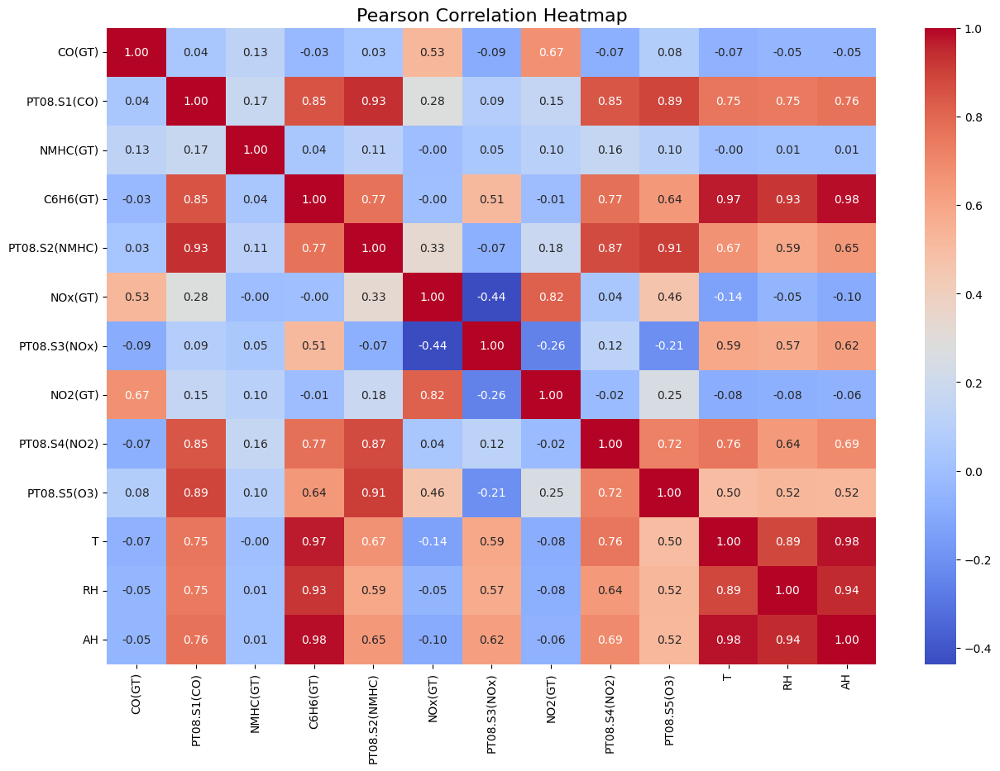

In [ ]:
plot_correlation_heatmap(pearson_corr, "Pearson Correlation Heatmap")

##Spearman correlation coefficient

In [ ]:
spearman_corr = df.corr(method='spearman')

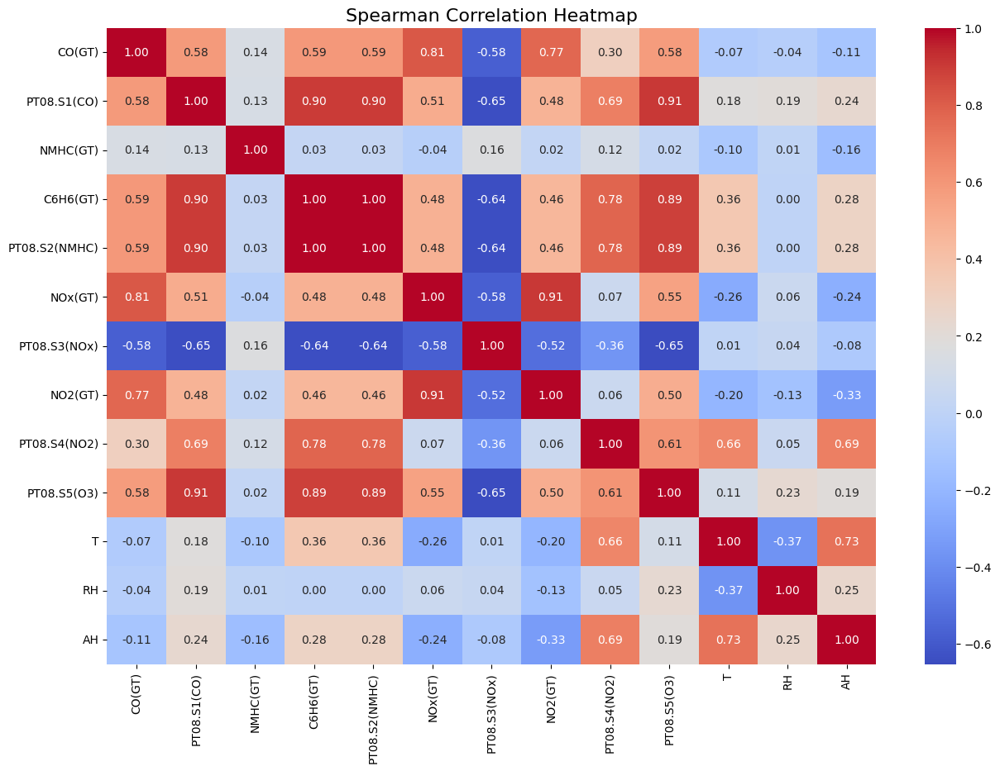

In [ ]:
plot_correlation_heatmap(spearman_corr, "Spearman Correlation Heatmap")

##Kendall correlation coefficient

In [ ]:
kendall_corr = df.corr(method='kendall')

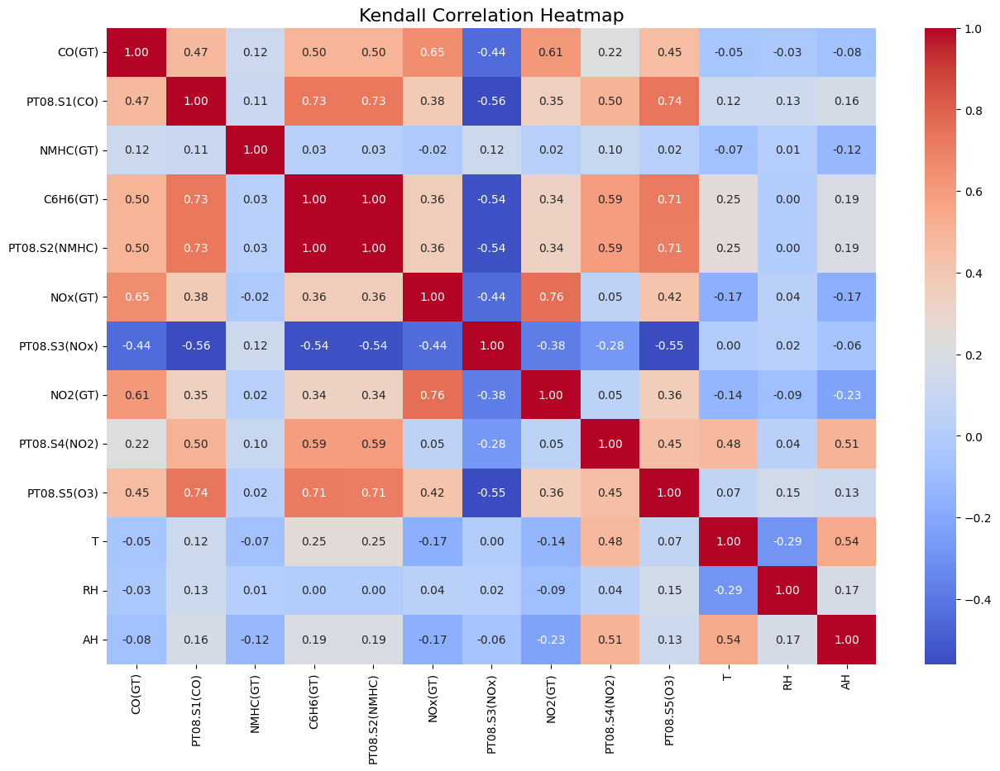

In [ ]:
plot_correlation_heatmap(kendall_corr, "Kendall Correlation Heatmap")

##Data preparation

We replace the NaN values ​​in the column with median values ​​because it is resistant to outliers.

In [ ]:
data.replace(-200, float('nan'), inplace=True)

In [ ]:
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns
data[numerical_columns] = data[numerical_columns].fillna(data[numerical_columns].median())

In [ ]:
print(data.isnull().sum())

Date             114
Time             114
CO(GT)             0
PT08.S1(CO)        0
NMHC(GT)           0
C6H6(GT)           0
PT08.S2(NMHC)      0
NOx(GT)            0
PT08.S3(NOx)       0
NO2(GT)            0
PT08.S4(NO2)       0
PT08.S5(O3)        0
T                  0
RH                 0
AH                 0
dtype: int64


We convert the given values of date and time ​​into numerical values ​​and if there are problems with parsing, we throw out those lines because we consider those readings invalid.

In [ ]:
data = data.dropna()

In [ ]:
print(data.isnull().sum())

Date             0
Time             0
CO(GT)           0
PT08.S1(CO)      0
NMHC(GT)         0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
PT08.S5(O3)      0
T                0
RH               0
AH               0
dtype: int64


In [ ]:
data['Date'] = pd.to_datetime(data['Date'], format='%d/%m/%Y', errors='coerce')

print(data['Date'].isna().sum())
data = data.dropna(subset=['Date'])


data['Day_of_year'] = data['Date'].dt.dayofyear.astype(float)
data['Month'] = data['Date'].dt.month.astype(float)
data['Year'] = data['Date'].dt.year.astype(float)

print(data[['Date', 'Day_of_year', 'Month', 'Year']].head())

0
        Date  Day_of_year  Month    Year
0 2004-03-10         70.0    3.0  2004.0
1 2004-03-10         70.0    3.0  2004.0
2 2004-03-10         70.0    3.0  2004.0
3 2004-03-10         70.0    3.0  2004.0
4 2004-03-10         70.0    3.0  2004.0


In [ ]:
data['Time'] = pd.to_datetime(data['Time'], format='%H.%M.%S', errors='coerce')

print(data['Time'].isna().sum())


data['Time'] = data['Time'].dt.hour.astype(float)

data = data.dropna(subset=['Time'])

0


In [ ]:
cols_to_scale = ['CO(GT)', 'PT08.S1(CO)', 'NMHC(GT)', 'PT08.S2(NMHC)',
               'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
               'T', 'RH', 'AH']

In [ ]:
scaler = StandardScaler()
scaled_data = data.copy()
scaled_data[cols_to_scale] = scaler.fit_transform(data[cols_to_scale])

In [ ]:
scaled_data.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Day_of_year,Month,Year
0,2004-03-10,18.0,0.386029,1.228781,-0.100241,11.9,0.412925,-0.354617,0.880318,0.014261,0.693887,0.633214,-0.542585,-0.020532,-0.673353,70.0,3.0,2004.0
1,2004-03-10,19.0,-0.067502,0.909382,-0.666943,9.4,0.065082,-0.677560,1.348952,-0.463597,0.301964,-0.124277,-0.577236,-0.091228,-0.754948,70.0,3.0,2004.0
2,2004-03-10,20.0,0.083675,1.426057,-1.024861,9.0,0.003922,-0.534030,1.213922,0.037016,0.290176,0.136750,-0.738941,0.279927,-0.692552,70.0,3.0,2004.0
3,2004-03-10,21.0,0.083675,1.303934,-1.144167,9.2,0.038324,-0.323861,1.023291,0.219057,0.375633,0.466873,-0.842894,0.633408,-0.600347,70.0,3.0,2004.0
4,2004-03-10,22.0,-0.369856,0.815441,-1.576650,6.5,-0.389791,-0.534030,1.472068,0.082526,0.098635,0.228878,-0.819793,0.609842,-0.595042,70.0,3.0,2004.0


We scaled our data and threw out the NaN values ​​we got as a parsing error in the Date and Time columns. We threw out the rows that had those values ​​as NaN because they were a small number compared to the whole dataset and we can say that they are invalid readings considering the lack of those values.

##Baseline Model - Linear Regression without Regularization

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error

We will drop our target value.

In [ ]:
X = data.drop(['C6H6(GT)', 'Date', 'Year', 'Month'], axis=1)
y = data['C6H6(GT)']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

LinearRegression()

In [ ]:
y_pred = linear_model.predict(X_test)

In [ ]:
print("Baseline model performance:")
print(f"MAE: {mean_absolute_error(y_test, y_pred):.3f}")
print(f"MSE: {mean_squared_error(y_test, y_pred):.3f}")

Baseline model performance:
MAE: 0.814
MSE: 1.344


##Evaluation

R² Score: 0.976


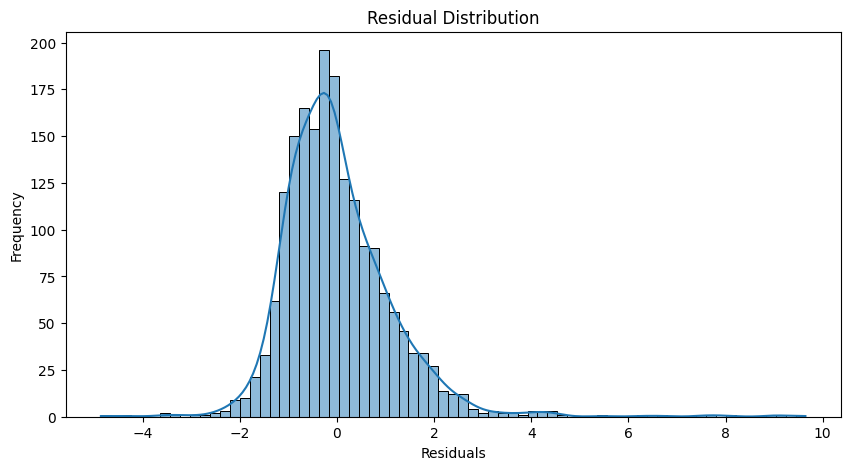

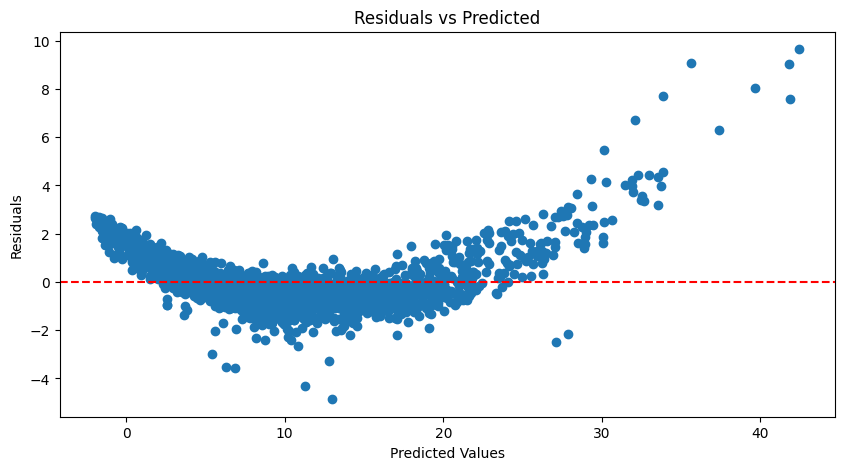

In [ ]:
# R² Score
r2_score = linear_model.score(X_test, y_test)

print(f"R² Score: {r2_score:.3f}")

# Rezidualna analiza
residuals = y_test - y_pred

plt.figure(figsize=(10, 5))
sns.histplot(residuals, kde=True)
plt.title("Residual Distribution")
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(10, 5))
plt.scatter(y_pred, residuals)
plt.axhline(0, color='red', linestyle='--')
plt.title("Residuals vs Predicted")
plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.show()

Small values ​​of mse and mae errors in relation to the order of magnitude of our target variable tell us that the model predicts our values ​​well. Also, the R**2 score tells us that the model predicts the values ​​of the target variable very well.

##Hyperparameter Tuning

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge = Ridge()
param_grid = {'alpha': [0.001, 0.1, 1, 10, 100]}

grid_search = GridSearchCV(ridge, param_grid, scoring='r2', cv=5)
grid_search.fit(X_train, y_train)

print(f"Best alpha for Ridge: {grid_search.best_params_['alpha']}")

Best alpha for Ridge: 1


For scoring, we use R**2 and Ridge correlation, which means we don't completely exclude any feature.

##Feature importance

In [ ]:
importance = linear_model.coef_
feature_names = X.columns


importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importance})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

print(importance_df)

          Feature  Importance
12             AH    1.823739
1          CO(GT)    0.264612
4   PT08.S2(NMHC)    0.031013
6    PT08.S3(NOx)    0.004286
5         NOx(GT)    0.001510
2     PT08.S1(CO)    0.001421
3        NMHC(GT)    0.000182
9     PT08.S5(O3)   -0.000511
13    Day_of_year   -0.001135
8    PT08.S4(NO2)   -0.001185
7         NO2(GT)   -0.008499
11             RH   -0.023403
0            Time   -0.038398
10              T   -0.087122


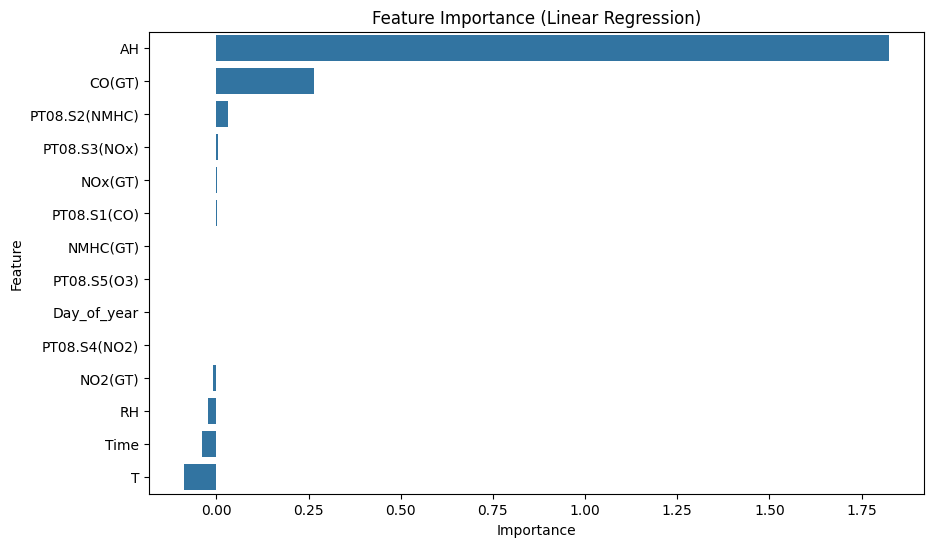

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(data=importance_df, x='Importance', y='Feature')
plt.title("Feature Importance (Linear Regression)")
plt.show()